# About Dataset
INTRODUCTION
The objective of the study is to analyse the flight booking dataset obtained from “Ease My Trip” website and to conduct various statistical hypothesis tests in order to get meaningful information from it. The 'Linear Regression' statistical algorithm would be used to train the dataset and predict a continuous target variable. 'Easemytrip' is an internet platform for booking flight tickets, and hence a platform that potential passengers use to buy tickets. A thorough study of the data will aid in the discovery of valuable insights that will be of enormous value to passengers.

Research Questions
The aim of our study is to answer the below research questions:
a) Does price vary with Airlines?
b) How is the price affected when tickets are bought in just 1 or 2 days before departure?
c) Does ticket price change based on the departure time and arrival time?
d) How the price changes with change in Source and Destination?
e) How does the ticket price vary between Economy and Business class?

DATA COLLECTION AND METHODOLOGY
Octoparse scraping tool was used to extract data from the website. Data was collected in two parts: one for economy class tickets and another for business class tickets. A total of 300261 distinct flight booking options was extracted from the site. Data was collected for 50 days, from February 11th to March 31st, 2022.
Data source was secondary data and was collected from Ease my trip website.

DATASET
Dataset contains information about flight booking options from the website Easemytrip for flight travel between India's top 6 metro cities. There are 300261 datapoints and 11 features in the cleaned dataset.

FEATURES
The various features of the cleaned dataset are explained below:
1) Airline: The name of the airline company is stored in the airline column. It is a categorical feature having 6 different airlines.
2) Flight: Flight stores information regarding the plane's flight code. It is a categorical feature.
3) Source City: City from which the flight takes off. It is a categorical feature having 6 unique cities.
4) Departure Time: This is a derived categorical feature obtained created by grouping time periods into bins. It stores information about the departure time and have 6 unique time labels.
5) Stops: A categorical feature with 3 distinct values that stores the number of stops between the source and destination cities.
6) Arrival Time: This is a derived categorical feature created by grouping time intervals into bins. It has six distinct time labels and keeps information about the arrival time.
7) Destination City: City where the flight will land. It is a categorical feature having 6 unique cities.
8) Class: A categorical feature that contains information on seat class; it has two distinct values: Business and Economy.
9) Duration: A continuous feature that displays the overall amount of time it takes to travel between cities in hours.
10)Days Left: This is a derived characteristic that is calculated by subtracting the trip date by the booking date.
11) Price: Target variable stores information of the ticket price.

===================To boost learning, try to create an end-to-end project using the dataset.==================================


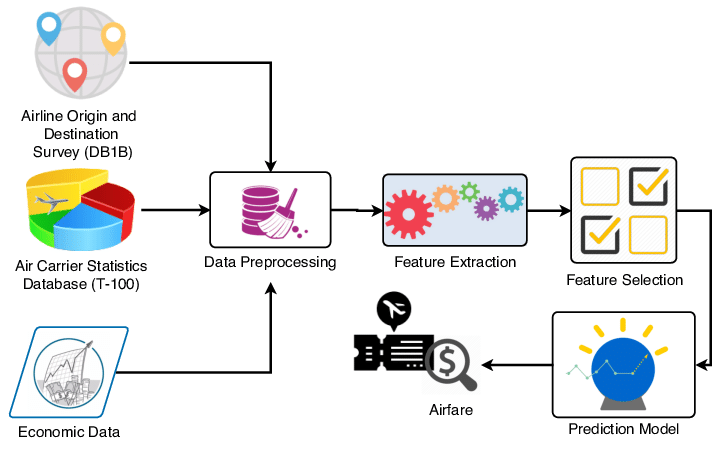

#### Importing libraries and modules commonly used in data analysis and machine learning, facilitating tasks such as data preprocessing, visualization, and model training and evaluation

In [113]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import LabelEncoder , MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score ,GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error , r2_score, mean_squared_error
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression , Ridge , Lasso ,LogisticRegression
from sklearn.tree import DecisionTreeRegressor ,DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor,KNeighborsClassifier
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor ,GradientBoostingRegressor ,RandomForestClassifier
from xgboost import XGBRegressor ,XGBClassifier
from sklearn.metrics import accuracy_score, recall_score ,confusion_matrix
import pickle





## Data Acquisition
<p>
A data set is typically a file containing data stored in one of several formats. Common file formats containing data sets include: .csv, .json, .xlsx etc. The data set can be stored in different places, on your local machine, on a server or a websiite, cloud storage and so on.<br>

To analyse data in a Python notebook, we need to bring the data set into the notebook. In this section, you will learn how to load a data set into our Jupyter Notebook.<br>

In our case, the Automobile Data set is an online source, and it is in a CSV (comma separated value) format. Let's use this data set as an example to practice reading data.
<ul>
    <li>Data source: <a href="https://www.kaggle.com/datasets/shubhambathwal/flight-price-prediction" target="_blank">https://archive.ics.uci.edu/ml/machine-learning-databases/autos/imports-85.data</a></li>
    <li>Data type: csv</li>
</ul>
The Pandas Library is a very popular and very useful tool that enables us to read various datasets into a data frame; our Jupyter notebook platforms have a built-in <b>Pandas Library</b> so that all we need to do is import Pandas without installing.
</p>


# <h2>Read Data</h2>
<p>
We utilize the <code>pandas.read_csv()</code> function for reading CSV files.
</p>

In [2]:
# read the data 
df=pd.read_csv(r"C:\Users\hp\DS\Flights_data.csv")

#### print the frist 10 rows

In [3]:
 
df.head(10)

# print the last 10 rows 
#df.tail(10)

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,229010,Vistara,UK-825,Mumbai,Morning,one,Morning,Delhi,Business,24.00,40.0,51372.0
1,46633,Air_India,AI-669,Mumbai,Morning,one,Night,Delhi,NaN,11.92,20.0,5990.0
2,285709,Vistara,UK-874,Hyderabad,Morning,one,Night,Chennai,Business,NaN,10.0,41314.0
3,206313,Air_India,AI-440,Chennai,Early_Morning,one,Morning,Hyderabad,Economy,26.83,45.0,3979.0
4,93646,Indigo,6E-426,Bangalore,Night,one,Early_Morning,Delhi,Economy,8.00,48.0,3236.0
5,289928,Vistara,UK-822,Chennai,Morning,one,Evening,Delhi,NaN,7.17,42.0,57920.0
6,255232,Air_India,AI-503,Bangalore,Evening,one,Morning,Kolkata,Business,15.17,38.0,60508.0
7,163531,GO_FIRST,G8-509,Hyderabad,Early_Morning,one,Morning,Mumbai,Economy,6.42,36.0,3423.0
8,193418,Indigo,6.00E-274,Chennai,Evening,zero,Night,Mumbai,Economy,2.00,46.0,3000.0
9,125999,Indigo,6E-6917,Kolkata,Afternoon,one,Night,Delhi,Economy,6.83,41.0,2994.0


In [4]:
df.sample(10)

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
18205,254072,Vistara,UK-854,Bangalore,Evening,NaN,Morning,Kolkata,Business,15.25,21.0,51817.0
2595,14081,GO_FIRST,G8-323,Delhi,Evening,one,Late_Night,Bangalore,Economy,5.75,22.0,4020.0
22796,242911,Vistara,UK-821,Mumbai,Early_Morning,zero,Morning,Chennai,Business,2.08,22.0,23898.0
42333,216707,Vistara,UK-933,Delhi,Afternoon,one,Evening,Kolkata,Business,28.42,14.0,65529.0
23675,259670,Vistara,UK-854,Bangalore,Evening,one,Morning,Chennai,Business,14.42,19.0,44280.0
45853,264053,Vistara,UK-772,Kolkata,Morning,NaN,Afternoon,Mumbai,Business,2.58,4.0,31982.0
38100,282389,Vistara,UK-830,Hyderabad,Morning,one,Evening,Bangalore,NaN,6.67,39.0,56702.0
2964,74696,Vistara,UK-958,Mumbai,Afternoon,one,Night,Hyderabad,Economy,10.50,32.0,3971.0
50273,274108,Vistara,UK-738,Kolkata,Evening,one,Morning,Chennai,Business,15.17,35.0,55983.0
6114,216943,Air_India,AI-544,Delhi,Evening,one,Morning,Kolkata,Business,14.83,18.0,43376.0


In [5]:
# drope the Unnamed: 0 	 column 
df.drop("Unnamed: 0",axis=1,inplace =True)

In [6]:
df.sample(4)

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
9667,Vistara,UK-778,Kolkata,Afternoon,NaN,Evening,Delhi,Economy,2.42,45.0,4001.0
8200,Air_India,AI-559,Hyderabad,Early_Morning,one,Evening,Kolkata,Economy,35.08,31.0,7047.0
4509,Vistara,UK-826,Chennai,Afternoon,one,Morning,Kolkata,Economy,21.17,38.0,7081.0
46557,Vistara,UK-963,Delhi,Morning,one,Evening,Bangalore,Business,10.42,33.0,57017.0


In [7]:
# print the shape of data

df.shape

(51938, 11)




# Data Wrangling



    

## Objectives



* Remove duplicated data 
* Handle missing values
* Correct data formatting
* Standardize and normalize data



In [8]:
# see th duplicated data 
df.duplicated().sum()

1169

In [9]:
df.drop_duplicates(inplace=True)

In [10]:
# see th duplicated data 
df.duplicated().sum()

0

### Heatmap function to visualize missing (null) values in a DataFrame. 

<Axes: >

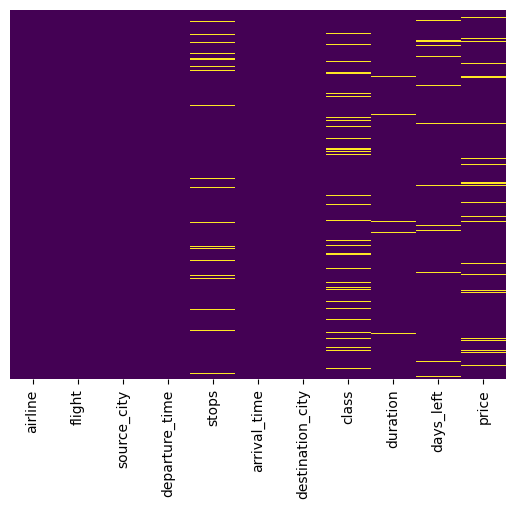

In [11]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

### see the number of the nan value 

In [12]:
df.isna().sum()

airline                0
flight                 0
source_city            0
departure_time         0
stops               3423
arrival_time           0
destination_city       0
class               4935
duration             629
days_left           1997
price               2992
dtype: int64

In [13]:
df['class'].unique()

array(['Business', nan, 'Economy'], dtype=object)

In [14]:
df['class'].value_counts()

class
Economy     30876
Business    14958
Name: count, dtype: int64

#### Calculate the mode of the "class" column
#### then Fill missing values in the "class" column with the mode

In [15]:
class_mode = df['class'].mode()[0]  # mode() returns a Series, [0] gets the first value

df['class'].fillna(class_mode, inplace=True)

In [16]:
df['stops'].unique()

array(['one', 'zero', nan, 'two_or_more'], dtype=object)

In [17]:
df['stops'].value_counts()

stops
one            39462
zero            5766
two_or_more     2118
Name: count, dtype: int64

### Fill missing values in the "Stops" column with the mode

In [18]:
df['stops'].fillna('one', inplace=True)

#### Calculate the mode of the "days_left" column
#### then Fill missing values in the "days_left" column with the mode

In [19]:
class_mode = df['days_left'].mode()[0]  
df['days_left'].fillna(class_mode, inplace=True)

### Drop rows with missing values in the "price" column

In [20]:

df.dropna(subset=['price','duration','days_left','stops' ,'class'], inplace=True)

#### Calculate the mode of the "duration" column
#### then Fill missing values in the "duration" column with the mean

In [21]:
duration_mean = df['duration'].mean() 
df['duration'].fillna(duration_mean, inplace=True)

### print the info 

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47257 entries, 0 to 51937
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   airline           47257 non-null  object 
 1   flight            47257 non-null  object 
 2   source_city       47257 non-null  object 
 3   departure_time    47257 non-null  object 
 4   stops             47257 non-null  object 
 5   arrival_time      47257 non-null  object 
 6   destination_city  47257 non-null  object 
 7   class             47257 non-null  object 
 8   duration          47257 non-null  float64
 9   days_left         47257 non-null  float64
 10  price             47257 non-null  float64
dtypes: float64(3), object(8)
memory usage: 4.3+ MB


### describe numiercal columns in "dataframe" 

In [23]:
df.describe()

#describe all the columns in "df" 
#df.describe(include = "all")

,duration,days_left,price
count,47257.000000,47257.000000,47257.000000
mean,12.206741,26.142540,21434.800495
std,7.206761,13.336019,22853.414265
min,0.830000,1.000000,1105.000000
25%,6.750000,15.000000,4827.000000
50%,11.250000,27.000000,7575.000000
75%,16.170000,37.000000,44144.000000
max,40.670000,49.000000,114704.000000


#### print the column of the dataframe

In [24]:
df.columns.tolist()

['airline',
 'flight',
 'source_city',
 'departure_time',
 'stops',
 'arrival_time',
 'destination_city',
 'class',
 'duration',
 'days_left',
 'price']




# Exploratory Data Analysis



    

## Objectives




* Explore features or characteristics 
* Analyze patterns and run descriptive statistical analysis

* Identify the effect of independent attributes 


### Perform analysis and Visualization on numerical data

### Plotting the distribution of flight prices

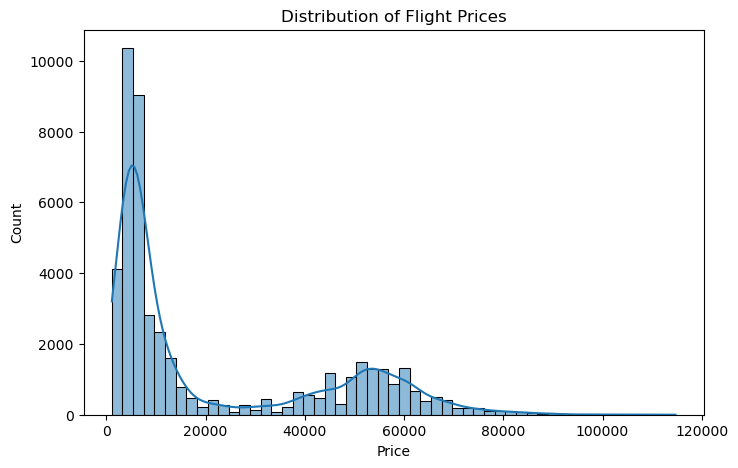

In [25]:

plt.figure(figsize=(8,5))
sns.histplot(df['price'], kde=True)
plt.title('Distribution of Flight Prices')
plt.xlabel('Price')
plt.ylabel('Count')
plt.show()

### histgram for 'duration' 

<Axes: >

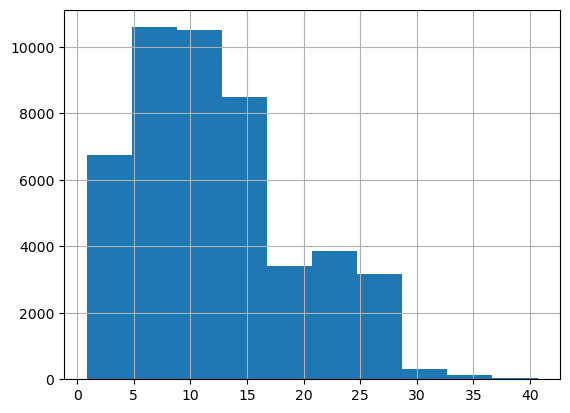

In [26]:
df['duration'].hist()

# see the outlier


<Axes: >

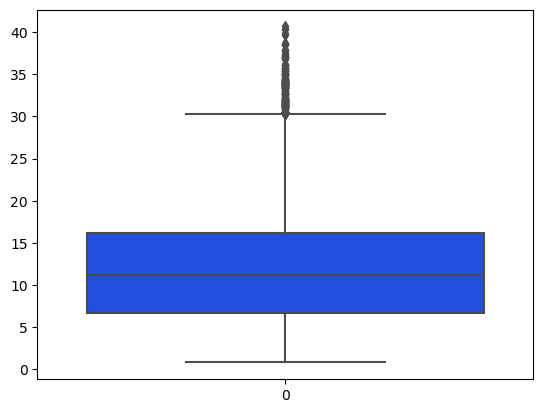

In [27]:
sns.boxplot(data=df['duration'],color='red',palette='bright')

#### lmplot function to create a scatter plot with a linear regression line fit for each level of the 'departure_time' column in the DataFrame.

D:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


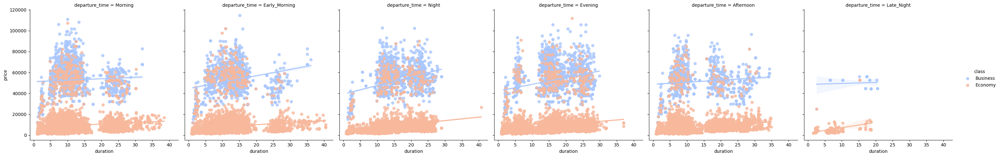

In [28]:
sns.lmplot(x='duration',y='price',data=df,col='departure_time',hue='class',palette='coolwarm')

#### plot the distribution of column  days_left 


<Axes: >

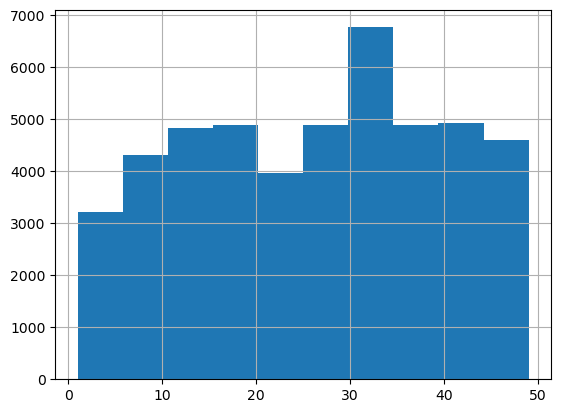

In [29]:
df['days_left'].hist()

### see the outlier

<Axes: >

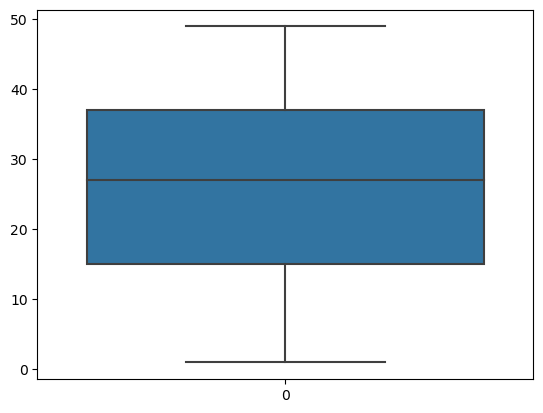

In [30]:
sns.boxplot(data=df['days_left'])

### create a scatter plot of 'price' versus 'duration' from the DataFrame

In [31]:
fig = px.scatter(df, x='price', y='duration', title='Price vs. Duration',
                 labels={'price': 'Price', 'duration': 'Duration'})

fig.show()

### Create a histogram of price

In [32]:
fig = px.histogram(df, x='price', title='Histogram of Price', 
                   labels={'price': 'Price', 'count': 'Frequency'})

fig.show()

### Create a box plot of "duration"

In [33]:
fig = px.box(df, y='duration', title='Box Plot of Duration', 
             labels={'duration': 'Duration'})

fig.show()

### Create a 3D scatter plot

In [34]:
fig = px.scatter_3d(df, x='price', y='duration', z='days_left', 
                    title='3D Scatter Plot', 
                    labels={'price': 'Price', 'duration': 'Duration', 'quantity': 'Quantity'})


fig.show()

#### scatter plot of 'duration' versus 'price' from the DataFrame 

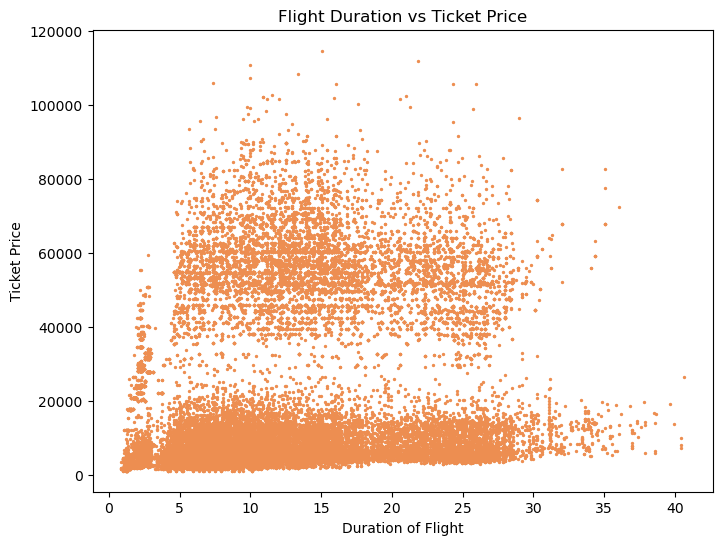

In [35]:
plt.figure(figsize=(8, 6))
plt.scatter(df['duration'], df['price'], s=2, color= '#ed8e51')

plt.title("Flight Duration vs Ticket Price")
plt.xlabel("Duration of Flight")
plt.ylabel("Ticket Price")
plt.show()


#### Selects only numerical columns from the DataFrame

##### The heatmap visualizes the correlation between numerical features in the DataFrame.
### Correlation Heatmap of Numerical Features

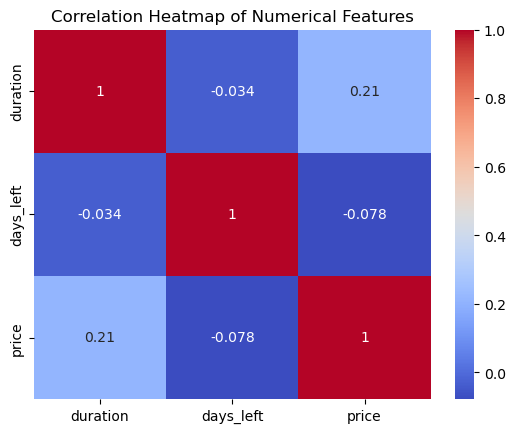

In [36]:
numerical_df = df.select_dtypes(include=['int64', 'float64'])

sns.heatmap(numerical_df.corr(), annot=True ,cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

'''This function, named outliers, takes two parameters:

    df: The DataFrame containing the data.
    ft: The name of the column (feature) for which outliers are to be detected.'''


In [37]:
def outliers(df,ft):
    q1 = df[ft].quantile(0.25)
    q3 = df[ft].quantile(0.75)
    iqr = q3 - q1 
    
    lower_limit = q1 - iqr *1.5
    upper_limit = q3 + iqr *1.5
    
    ls = df.index[(df[ft]<lower_limit) | (df[ft]>upper_limit)]
    
    return ls

In [38]:
index_list = []
index_list.extend(outliers(df,'duration'))

#### Remove Outliers

In [39]:
def remove(df,ls):
    df = df.drop(ls)
    return df

In [40]:
df = remove(df,index_list)

In [41]:
df.shape

(46955, 11)

### Perform analysis and Visualization on categorical data

#



## _______

In [42]:
df['airline'].unique()

array(['Vistara', 'Air_India', 'Indigo', 'GO_FIRST', 'AirAsia',
       'SpiceJet'], dtype=object)

#### Generates a DataFrame called airline_count that contains the counts of unique values in the 'airline' column of the DataFrame 




In [43]:
airline_count=df['airline'].value_counts().reset_index()
airline_count 

,airline,count
0,Vistara,20144
1,Air_India,12664
2,Indigo,6735
3,GO_FIRST,3551
4,AirAsia,2470
5,SpiceJet,1391


## Create a bar chart

#

In [44]:
airline_count.columns = ['Airline', 'Count']  # Rename columns for clarity


fig = px.bar(airline_count, x='Airline', y='Count', 
             title='Number of Flights by Airline',
             labels={'Airline': 'Airline', 'Count': 'Number of Flights'})
fig.show()

In [45]:
df['flight'].nunique()

1433

In [46]:
df['source_city'].nunique()

6

#### Generates a DataFrame called airline_count that contains the counts of unique values in the 'source_city' column of the DataFrame

In [47]:
source_city_count=df['source_city'].value_counts().reset_index()
source_city_count

,source_city,count
0,Delhi,10249
1,Mumbai,9409
2,Bangalore,8069
3,Kolkata,7148
4,Hyderabad,6327
5,Chennai,5753


### Create a Pie chart
#

In [48]:
fig = px.pie(source_city_count, values='count', names='source_city',title='source_city ')
fig.show()

In [49]:
df['departure_time'].unique()

array(['Morning', 'Early_Morning', 'Night', 'Evening', 'Afternoon',
       'Late_Night'], dtype=object)

#### Generates a DataFrame called airline_count that contains the counts of unique values in the 'departure_time' column of the DataFrame

In [50]:
departure_time_count=df['departure_time'].value_counts().reset_index()
departure_time_count

,departure_time,count
0,Morning,11247
1,Evening,10263
2,Early_Morning,10261
3,Night,7517
4,Afternoon,7445
5,Late_Night,222


### Create a Pie chart
#

In [51]:
fig = px.pie(departure_time_count, values='count', names='departure_time',title='departure_time')
fig.show()

In [52]:
df['stops'].unique()

array(['one', 'zero', 'two_or_more'], dtype=object)

#### Generates a DataFrame called airline_count that contains the counts of unique values in the 'departure_time' column of the DataFrame

In [53]:
stops_count=df['stops'].value_counts().reset_index()

fig = px.pie(stops_count, values='count', names='stops',title='types of stops ')
fig.show()

In [54]:
arrival_time_count=df['arrival_time'].value_counts().reset_index()
fig = px.pie(arrival_time_count, values='count', names='arrival_time',title='arrival_time')
fig.show()

In [55]:
df['class'].unique()

array(['Business', 'Economy'], dtype=object)

In [56]:
class_count=df['class'].value_counts().reset_index()
class_count

,class,count
0,Economy,33021
1,Business,13934


In [57]:
fig = px.pie(class_count, values='count', names='class',title='Type Of classes ')
fig.show()

## Encode  the data 

In [58]:

column=['airline','source_city','departure_time','stops','arrival_time','destination_city','class' ,'flight']

df[column] = df[column].apply(LabelEncoder().fit_transform)


In [59]:
df.sample(5)

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
1648,2,1017,3,0,2,2,2,1,2.17,36.0,2276.0
37968,2,966,3,1,0,2,5,1,12.58,25.0,4165.0
32548,5,1378,0,1,0,2,3,1,10.33,46.0,5871.0
45051,1,691,3,2,0,4,5,1,17.92,5.0,7774.0
47781,3,261,5,1,0,0,1,1,7.67,17.0,5727.0


## Calculate the correlation matrix

#### Create the heatmap

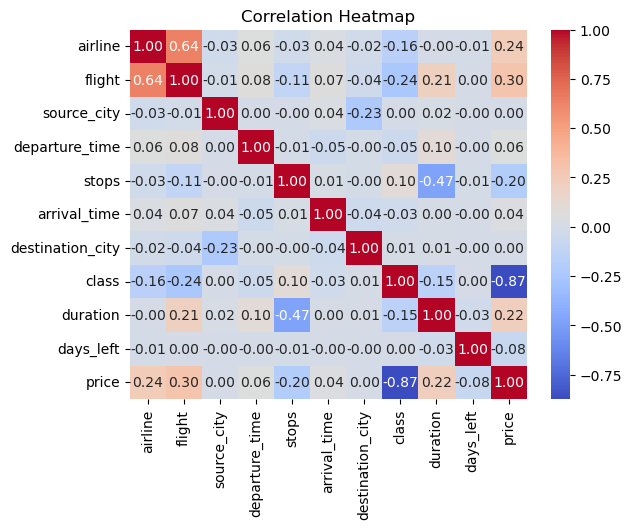

In [60]:
correlation_matrix = df.corr()

sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [61]:
data1 = df.copy()

#### Create a MinMaxScaler object

#### Apply scaling to the numerical columns

In [62]:
numerical_columns = ['airline', 'flight', 'source_city', 'departure_time', 'stops','arrival_time', 'destination_city', 'class', 'duration', 'days_left']
scaler = MinMaxScaler()
data1[numerical_columns] = scaler.fit_transform(data1[numerical_columns])

In [63]:
data1.sample(5)

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
23918,1.0,0.991620,1.0,0.8,0.0,1.0,0.0,0.0,0.337186,0.937500,66928.0
45252,0.2,0.468575,0.0,0.0,0.0,1.0,0.2,1.0,0.320190,0.895833,6444.0
18692,1.0,0.957402,0.0,0.4,0.0,0.8,0.4,1.0,0.439157,0.750000,4796.0
3617,0.2,0.510475,1.0,0.0,0.0,0.4,0.4,1.0,0.861319,0.354167,5439.0
10910,1.0,0.922486,0.8,0.4,0.0,0.8,0.0,1.0,0.456152,0.916667,8111.0


In [64]:
x = data1[['airline', 'flight', 'source_city', 'departure_time', 'stops', 'arrival_time', 'destination_city', 'class', 'duration', 'days_left']]
y = data1['price']

## selected features Using RFE 

In [65]:
model = RandomForestRegressor()
rfe = RFE(model, n_features_to_select=5)
rfe.fit(x, y)

selected_features = x.columns[rfe.support_]

In [66]:
selected_features

Index(['flight', 'destination_city', 'class', 'duration', 'days_left'], dtype='object')

In [67]:
x = data1[['flight','destination_city', 'class', 'duration', 'days_left']]
y = data1['price']

In [68]:
x[:5]

,flight,destination_city,class,duration,days_left
0,0.944134,0.4,0.0,0.787559,0.812500
1,0.517458,0.4,1.0,0.376954,0.395833
3,0.454609,0.6,1.0,0.883753,0.916667
4,0.144553,0.4,1.0,0.243712,0.979167
5,0.942039,0.4,1.0,0.215500,0.854167


In [69]:
# split data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

print('x_train size',X_train.shape)
print('y_train size',y_train.shape)
print('x_test size',X_test.shape)
print('y_test size',y_test.shape)

x_train size (37564, 5)
y_train size (37564,)
x_test size (9391, 5)
y_test size (9391,)


In [70]:
X_train[1:5]

,flight,destination_city,class,duration,days_left
22315,0.922486,1.0,1.0,0.543848,0.270833
24161,0.988128,0.0,1.0,0.260707,0.354167
13904,0.462291,1.0,0.0,0.807274,0.583333
17533,0.997905,0.8,0.0,0.212441,0.437500


In [72]:
# Define the models to evaluate
models = {
    'Ridge': (Ridge(), {'alpha': np.arange(0.01, 1, 0.09)}),
    'DecisionTreeRegressor': (DecisionTreeRegressor(), {'criterion': ['squared_error', 'absolute_error']}),
    'RandomForestRegressor': (RandomForestRegressor(), {'n_estimators':  np.arange(10,400,50), 'max_depth': np.arange(3,20,3)}),
    'KNeighborsRegressor': (KNeighborsRegressor(), {'n_neighbors': np.arange(2,6)}),
    'XGBRegressor': (XGBRegressor(), {'n_estimators':  np.arange(10,400,50)}),

}

best_rmse = float('inf')
best_model = None

for name, (model, param_grid) in models.items():
    # Perform grid search with cross-validation
    grid_search = GridSearchCV(model, param_grid=param_grid, cv=2)

    # Train the model
    grid_search.fit(X_train, y_train)

    # Make predictions
    y_pred = grid_search.predict(X_test)

    # Evaluate the model
    mse= mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae= mean_absolute_error(y_test, y_pred)
    print(f"Model: {name}")
    print('mean_absolute_error:', mae)
    print('mean_squared_error:', mse)
    print('Root_mean_squared_error:', rmse)


    # Check if this model has the best RMSE so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_model = grid_search.best_estimator_

    # Print the best parameters and best model
    print(name, 'Best parameters:', grid_search.best_params_)
    print('\n')

# Print the best model based on RMSE
print(f"Best model based on RMSE: {best_model}")

Model: Ridge
mean_absolute_error: 6219.300442246722
mean_squared_error: 109881432.60023625
Root_mean_squared_error: 10482.43447869989
Ridge Best parameters: {'alpha': 0.9099999999999999}


Model: DecisionTreeRegressor
mean_absolute_error: 3960.311894366947
mean_squared_error: 129601895.289852
Root_mean_squared_error: 11384.282818423477
DecisionTreeRegressor Best parameters: {'criterion': 'absolute_error'}


Model: RandomForestRegressor
mean_absolute_error: 3980.3776750055135
mean_squared_error: 69591115.42884807
Root_mean_squared_error: 8342.12895062454
RandomForestRegressor Best parameters: {'max_depth': 12, 'n_estimators': 260}


Model: KNeighborsRegressor
mean_absolute_error: 5183.234160366308
mean_squared_error: 92660666.09576829
Root_mean_squared_error: 9626.041039584668
KNeighborsRegressor Best parameters: {'n_neighbors': 5}


Model: XGBRegressor
mean_absolute_error: 4223.648773071091
mean_squared_error: 71339493.74491037
Root_mean_squared_error: 8446.270996416724
XGBRegressor Be

In [71]:
lr=LinearRegression()

In [72]:
lr.fit(X_train,y_train)

LinearRegression()

In [73]:
lr.score(X_train,y_train)

0.7843399191542615

In [74]:
lr.score(X_test,y_test)

0.7887929138602494

In [75]:
ridge_reg = Ridge(alpha=1)


In [76]:
ridge_reg.fit(X_train, y_train)


Ridge(alpha=1)

In [77]:
# train score 
ridge_reg.score(X_train,y_train)

0.7843399066152053

In [78]:
# train score 
ridge_reg.score(X_test,y_test)

0.788794363828859

In [79]:
# calculate the mean score error to the linear regression model 
scores = cross_val_score(lr,x , y, cv=4)

print("Cross-Validation Scores:", scores)
print("Mean R^2 Score:", scores.mean())

Cross-Validation Scores: [0.79207712 0.78420548 0.78128822 0.78246002]
Mean R^2 Score: 0.7850077079056418


In [80]:
# knn object with the hyper parameter n_neighbors=2
knn = KNeighborsRegressor(n_neighbors=2)

In [81]:
# fit the model with x_train & y_train
knn.fit(X_train,y_train)


KNeighborsRegressor(n_neighbors=2)

In [82]:
# train score 
knn.score(X_train,y_train)

0.9219298328879725

In [83]:
# test score
knn.score(X_test,y_test)

0.7769101800868187

In [84]:
#  xgboost object
xgb = XGBRegressor( max_depth= 10)

In [85]:
# fit the model
xgb.fit(X_train,y_train);

In [86]:
# print the accuracy of model
print ("train accuracy",xgb.score(X_train , y_train))
print ("test accuracy",xgb.score(X_test , y_test))

train accuracy 0.9731097445799708
test accuracy 0.837477481466108


In [87]:
Random_Forest=RandomForestRegressor()

In [88]:
Random_Forest.fit(X_train,y_train)

RandomForestRegressor()

In [89]:
Random_Forest.score(X_train,y_train)

0.9739448598743912

In [90]:
Random_Forest.score(X_test,y_test)

0.8528312244033519

In [91]:
Decision_Tree=DecisionTreeRegressor()

In [92]:
Decision_Tree.fit(X_train,y_train)

DecisionTreeRegressor()

In [93]:
Decision_Tree.score(X_train,y_train)

0.9926837873437395

In [94]:
Decision_Tree.score(X_test,y_test)

0.7362341506594204

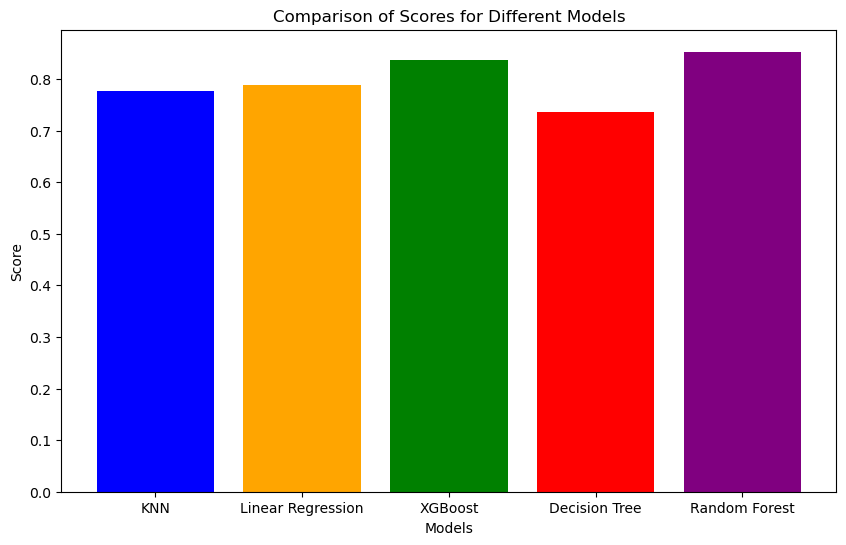

In [95]:
# Define the results
models = ['KNN', 'Linear Regression', 'XGBoost', 'Decision Tree', 'Random Forest']
scores = [knn.score(X_test, y_test), lr.score(X_test, y_test), xgb.score(X_test, y_test),
          Decision_Tree.score(X_test, y_test), Random_Forest.score(X_test, y_test)]  # Replace these with your actual scores

# Define colors for each bar
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Plot the bar plot
plt.figure(figsize=(10, 6))
plt.bar(models, scores, color=colors)
plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Comparison of Scores for Different Models')
plt.show()


In [96]:
pickle.dump(xgb, open('model.pkl','wb'))


In [97]:
model = pickle.load(open('model.pkl','rb'))
print(model.predict([[0.273992, 5, 1, 0.045547,0.041667]]))

[9553.054]


In [96]:
x[50:55]

,flight,destination_city,class,duration,days_left
54,0.925978,0.4,0.0,0.362678,0.875000
55,0.466480,1.0,0.0,0.105031,0.708333
56,0.493017,0.4,0.0,0.708362,0.020833
57,0.991620,0.2,1.0,0.254929,1.000000
58,0.483939,0.0,0.0,0.705303,0.062500


In [97]:
df.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,5,1352,5,4,0,4,2,0,24.00,40.0,51372.0
1,1,741,5,4,0,5,2,1,11.92,20.0,5990.0
3,1,651,1,1,0,4,3,1,26.83,45.0,3979.0
4,3,207,0,5,0,1,2,1,8.00,48.0,3236.0
5,5,1349,1,4,0,2,2,1,7.17,42.0,57920.0


In [98]:
data2=df.copy()


In [99]:
data2.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,5,1352,5,4,0,4,2,0,24.00,40.0,51372.0
1,1,741,5,4,0,5,2,1,11.92,20.0,5990.0
3,1,651,1,1,0,4,3,1,26.83,45.0,3979.0
4,3,207,0,5,0,1,2,1,8.00,48.0,3236.0
5,5,1349,1,4,0,2,2,1,7.17,42.0,57920.0


In [100]:
x = data2[['price', 'flight', 'source_city', 'departure_time', 'stops', 'arrival_time', 'destination_city', 'class', 'duration', 'days_left']]
y = data2['airline']

In [101]:
model = RandomForestRegressor()
rfe = RFE(model, n_features_to_select=5)
rfe.fit(x, y)
# Get selected features
selected_features = x.columns[rfe.support_]


In [102]:
selected_features

Index(['flight', 'destination_city', 'class', 'duration', 'days_left'], dtype='object')

In [103]:
x = data2[['flight','destination_city', 'class', 'duration', 'days_left','price']]
y = data2['airline']

In [104]:
# split data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

print('x_train size',X_train.shape)
print('y_train size',y_train.shape)
print('x_test size',X_test.shape)
print('y_test size',y_test.shape)

x_train size (37564, 6)
y_train size (37564,)
x_test size (9391, 6)
y_test size (9391,)


In [105]:
y_train

30986    2
22315    5
24161    5
13904    1
17533    5
        ..
12283    5
49404    1
41971    1
931      3
17207    5
Name: airline, Length: 37564, dtype: int32

In [106]:
knn=KNeighborsClassifier(n_neighbors=6)

In [107]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=6)

In [108]:
y_pred=knn.predict(X_test)
y_pred


array([5, 1, 5, ..., 1, 5, 3])

In [109]:
conf_matrix = confusion_matrix(y_test,y_pred)
conf_matrix

array([[ 501,    0,    3,    0,    8,    4],
       [   1, 2500,    4,    4,    0,    4],
       [   6,   16,  659,    0,    0,    1],
       [   0,   42,    0, 1360,    0,    0],
       [  11,    0,    0,    0,  244,   14],
       [   0,    0,    0,    0,    5, 4004]], dtype=int64)

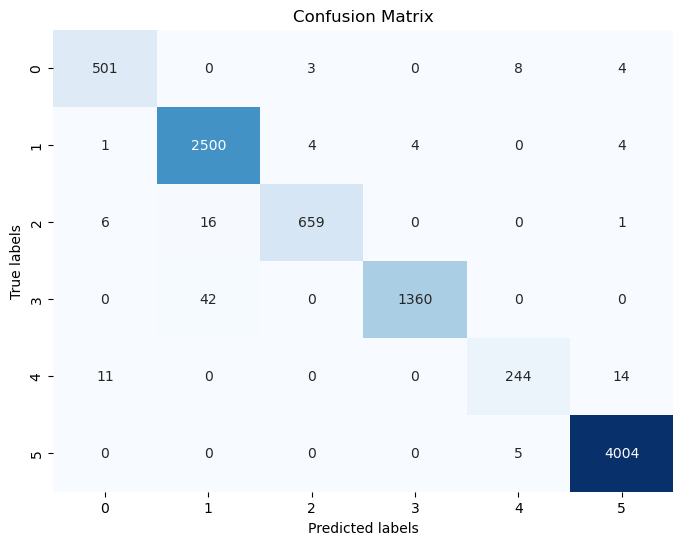

In [110]:
# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("Confusion Matrix")
plt.show()

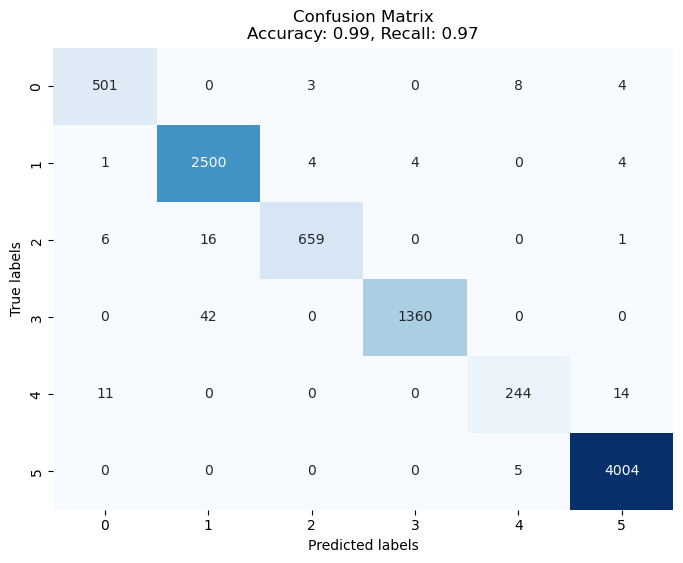

In [111]:
# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Compute accuracy and recall
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='macro')  # Change average as needed

# Display the confusion matrix with accuracy and recall
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title(f"Confusion Matrix\nAccuracy: {accuracy:.2f}, Recall: {recall:.2f}")
plt.show()


D:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



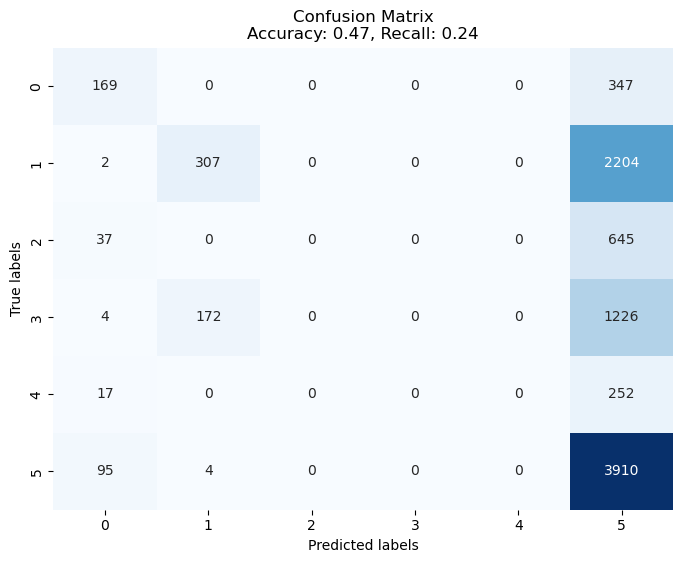

In [114]:
# Instantiate and train the logistic regression model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Predict on the test set
y_pred = logreg.predict(X_test)

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Compute accuracy and recall
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='macro')  # Change average as needed

# Display the confusion matrix with accuracy and recall
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title(f"Confusion Matrix\nAccuracy: {accuracy:.2f}, Recall: {recall:.2f}")
plt.show()
